Gradient-weighted Class Activation Mapping (Grad-CAM)

배경
- CAM은 CNN이 이미지의 클래스를 예측할 때 특정 클래스에 활성화된 heatmap을 추론하는 방법으로 가장 일반적인 Grad-CAM을 도입하였음.
- 이는 AI의 결정을 시각적으로 설명해서 의사에게 AI의 결정에 신뢰를 주는 한 편,
- '0' 혹은 '1'의 이미지 수준의 라벨링만으로 AI가 병변의 위치를 찾아내는 것에 의의가 있음
- weakly supervised object localization이라는 이름으로도 불리움 

한계
- 보통 Grad-CAM은 결정단에 가장 가까운 convolutional layer의 feature map을 사용하는데,
- baseline network에서 마지막 maxpooling이 지나면 4x4로 512x512로 Grad-CAM을 확대할때, resolution이 크게 저하됨
- 현재, 그냥 6번째 block의 두번째 convolutional layer에서 16x16을 뽑는 걸로 대체하고 있음 (4x4에서 뽑은 거랑 크게 달라지지도 않고, 훨씬 해상도가 나아서)
- 예상외로 잘 보는 것도 있지만, 못 보는 것도 많음..
- binary classificaiton으로 훈련시키지만, positive 클래스 안에 여러가지 종류의 병변이 있고, 그 병변에 따라 잘 보고 못 보고가 갈리기도 함. 
- 헷갈리는 데이터가 많아져 문제가 난해해질수록, CAM 성능도 같이 저하되는 것으로 생각됨

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import time, datetime
import torch
from torch import nn
from torch.nn import functional as F

In [2]:
gpu_idx = 3

if torch.cuda.is_available() and type(gpu_idx) == int:
    device = torch.device("cuda:{}".format(gpu_idx))
    current_device = torch.cuda.current_device()
    print("Device: {} ({})\n".format(torch.cuda.get_device_name(current_device), device))
else:
    device = torch.device('cpu')
    print("Device: CPU\n")

Device: GeForce RTX 2080 Ti (cuda:3)



# 1. Load data

In [3]:
import pickle, cv2

def gen_label(data, cls):
#     label = cls*np.ones([data.shape[0]])
    label = cls*np.ones([len(data)])
    return label

def Image_norm(img, mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]):
    """
    img: np.array (h, w, ch) or (n, h, w, ch) ~ [0, 255] integer
    mean and std vaules were used for normalizing input data to ImageNet models in torch 
    """
    return (img/255-mean)/std

def reshape4torch(img, norm = False):
    """
    (sample #, height, width, channel) -> (sample #, channel, height, width)
    """
    if norm == True:
        img = Image_norm(img)
        
    if len(img.shape) == 4:
        img = np.transpose(img, (0, 3, 1, 2))
        return img
    elif len(img.shape) == 3:
        img = np.transpose(img, (2, 0, 1))
        return np.expand_dims(img, axis=0)

def load_image_from_path(path_list, normalization = False, extract_name = False):
    data = []
    for i in path_list:
        temp = cv2.imread(i)

        data.append(temp)
    if extract_name != False:
        name = []
        for i in path_list:
            name.append(os.path.basename(i))
        return reshape4torch(np.asarray(data), norm = normalization), np.asarray(name)
    else:
        return reshape4torch(np.asarray(data), norm = normalization)

def test_data_load(filename):
    
    root = '/mnt/disk2/data/private_data/SMhospital/capsule/1 preprocessed'
    data_dir = root + '/database'
    
    with open(root + '/' + filename, "rb") as f:
        data_config = pickle.load(f)

    test_files = data_config['test_files']

    test_names, test_Xs, test_Ys = [], [], []
    for i, test_file in enumerate(test_files):
        test_path = [os.path.join(data_dir, f) for f in test_file]
        print(len(test_path))
        test_Ys.append(gen_label(test_path, int(i)))

        imgs, filenames = load_image_from_path(test_path, extract_name = True)
        test_Xs.append(imgs)
        test_names.append(filenames)
        
    test_name = np.concatenate(test_names)
    test_X = np.concatenate(test_Xs)
    test_Y = np.concatenate(test_Ys)
    
    return test_name, test_X, test_Y

In [4]:
test_name, test_X, test_Y = test_data_load('data_config_np-hd_frb_sv.pkl')

test_X.shape, test_Y.shape

1005
1362


((2367, 3, 512, 512), (2367,))

# 2. Load model

In [5]:
class CNN_v1(nn.Module):
    def __init__(self, n_ch, n_cls):
        super().__init__()

        self.conv1_1 = nn.Conv2d(n_ch, 16, 3, 1, padding=1)
        self.conv1_2 = nn.Conv2d(16, 16, 3, 1, padding=1)
        self.maxp1 = nn.MaxPool2d(2, 2)
        
        self.conv2_1 = nn.Conv2d(16, 16, 3, 1, padding=1)
        self.conv2_2 = nn.Conv2d(16, 16, 3, 1, padding=1)
        self.maxp2 = nn.MaxPool2d(2, 2)
        
        self.conv3_1 = nn.Conv2d(16, 16, 3, 1, padding=1)
        self.conv3_2 = nn.Conv2d(16, 16, 3, 1, padding=1)
        self.maxp3 = nn.MaxPool2d(2, 2)
        
        self.conv4_1 = nn.Conv2d(16, 32, 3, 1, padding=1)
        self.conv4_2 = nn.Conv2d(32, 32, 3, 1, padding=1)
        self.maxp4 = nn.MaxPool2d(2, 2)

        self.conv5_1 = nn.Conv2d(32, 32, 3, 1, padding=1)
        self.conv5_2 = nn.Conv2d(32, 32, 3, 1, padding=1)
        self.maxp5 = nn.MaxPool2d(2, 2)
        
        self.conv6_1 = nn.Conv2d(32, 32, 3, 1, padding=1)
        self.conv6_2 = nn.Conv2d(32, 32, 3, 1, padding=1)
        self.maxp6 = nn.MaxPool2d(2, 2)
        
        self.conv7_1 = nn.Conv2d(32, 64, 3, 1, padding=1)
        self.conv7_2 = nn.Conv2d(64, 64, 3, 1, padding=1)
        self.maxp7 = nn.MaxPool2d(2, 2)
        
        self.dense1 = nn.Linear(4*4*64, 100)
        self.dropout1 = nn.Dropout(0.3)
        self.dense2 = nn.Linear(100, 50)
        self.dropout2 = nn.Dropout(0.3)
        self.dense3 = nn.Linear(50, n_cls)
        
    def forward(self, x):
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = self.maxp1(x)
        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = self.maxp2(x)
        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = self.maxp3(x)
        x = F.relu(self.conv4_1(x))
        x = F.relu(self.conv4_2(x))
        x = self.maxp4(x)
        x = F.relu(self.conv5_1(x))
        x = F.relu(self.conv5_2(x))
        x = self.maxp5(x)
        x = F.relu(self.conv6_1(x))
        x = F.relu(self.conv6_2(x))
        x = self.maxp6(x)
        x = F.relu(self.conv7_1(x))
        x = F.relu(self.conv7_2(x))
        x = self.maxp7(x)
        # flatten
        x = x.view(-1, 4*4*64)
        feature = F.relu(self.dense1(x))
        x = self.dropout1(feature)
        x = F.relu(self.dense2(x))
        x = self.dropout2(x)
        x = self.dense3(x)
        x = F.softmax(x, dim = -1)
        return x

In [6]:
model_dir = './model/'
model_name = 'np-hd_---_--'

def find_models(model_dir, model_name):
    model_list = [i for i in sorted(os.listdir(model_dir)) if model_name in i]
#     model_list = sorted(glob.glob('nh/model/{}*'.format(model_name)))
    return model_list

model_list = find_models(model_dir, model_name)
model_list

n_ch = 3
n_cls = 2

network = CNN_v1(n_ch, n_cls)
        
model = network
model = model.to(device)

model_file = model_list[-1]

model.load_state_dict(torch.load(model_dir + model_file, map_location=lambda storage, loc: storage.cuda(gpu_idx)))
model.eval()

CNN_v1(
  (conv1_1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv1_2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxp1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2_1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxp2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3_1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxp3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv4_1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4_2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxp4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5_1): Conv

# 3. Grad-CAM 

## 3.1. Step by step

In [7]:
img = np.expand_dims(test_X[-1], axis=0)

x = torch.tensor(img, device=device).float()
img_shape = img.shape[2:]
(dark_xs, dark_ys) = np.where(np.mean(img[0], axis = 0) < 6)

In [8]:
test_Y[-1]

1.0

모델 (network)의 layer들은 위에서 정의했듯이 아래와 같음

In [9]:
list(model._modules.keys())

['conv1_1',
 'conv1_2',
 'maxp1',
 'conv2_1',
 'conv2_2',
 'maxp2',
 'conv3_1',
 'conv3_2',
 'maxp3',
 'conv4_1',
 'conv4_2',
 'maxp4',
 'conv5_1',
 'conv5_2',
 'maxp5',
 'conv6_1',
 'conv6_2',
 'maxp6',
 'conv7_1',
 'conv7_2',
 'maxp7',
 'dense1',
 'dropout1',
 'dense2',
 'dropout2',
 'dense3']

- target하는 layer에 대해서 feature map들을 forward로 계산하여 얻어냄
- 해당하는 feature map의 gradient를 backward 계산할 수 있도록 hook으로 담아놓음
- 모델 구조에서 activation function relu가 빠져있으므로 포함해서 잘 계산함 

In [10]:
target_layers = [layer for layer in model._modules.keys() if 'conv' in layer or 'maxp' in layer]

grad_by_layer = []
def save_gradient(grad):
    grad_by_layer.append(grad)

feature_by_layer = []

for name, module in model._modules.items():
    x = module(x)
    if 'conv' in name:
        x = nn.ReLU()(x)
    if name in target_layers:
        feature_by_layer.append(x) 
        x.register_hook(save_gradient)
    if 'maxp7' == name:
        x = x.view(x.size(0), -1)

In [11]:
x

tensor([[-92.7561,  89.2325]], device='cuda:3', grad_fn=<AddmmBackward>)

In [12]:
len(feature_by_layer)

21

아직 비어있는 것을 확인할 수 있음

In [13]:
grad_by_layer

[]

- target하는 class로 backward 계산하여 위에서 register hook으로 걸어놨던 gradient를 계산함

In [14]:
target_class = 1

logits = x
#  logits = F.softmax(x, -1)
        
one_hot = np.zeros((img.shape[0], 2), dtype=np.float32)
one_hot = torch.from_numpy(one_hot).to(device).requires_grad_(True)

if target_class == None:
    for i, cls in enumerate(logits.argmax(axis =1).tolist()):
        one_hot[i, cls] = 1
elif target_class is not None:
    one_hot[:, target_class] = 1
#         one_hot = np.sum(logits * one_hot)

for target_layer in target_layers:
    model._modules[target_layer].zero_grad()

model.zero_grad()

logits.backward(gradient=one_hot, retain_graph=True)

In [15]:
len(grad_by_layer)

21

- gradient로는 weight을 정의해서 해당하는 channel의 feature map과 곱하여 summation하면 Grad-CAM이 얻어짐


In [16]:
cam_by_layer = []
for features, gradients in zip(feature_by_layer, reversed(grad_by_layer)): 
    cams = []
    for n, feature, gradient in zip(range(len(img)), features, gradients):

        grad_val = gradient.data.cpu().numpy()
        weights = np.mean(grad_val, axis=(1, 2))

        target = feature.cpu().data.numpy()
        cam = np.zeros(target.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * target[i, :, :]

        cam = np.maximum(cam, 0)
        cam_re = cv2.resize(cam, img.shape[2:], interpolation=cv2.INTER_CUBIC)
        cam_re = cam_re - np.min(cam_re)
        cam_re = cam_re / np.max(cam_re)
        cam_re[dark_xs, dark_ys] = 0

        heatmap = cv2.applyColorMap((cam_re*255).astype('uint8'), cv2.COLORMAP_JET)
        target_pic = np.transpose(img[n], (1, 2, 0))
        cam_on_img = (heatmap*0.3 + target_pic*0.7).astype('uint8')

        cams.append(cam_on_img)  
    cam_by_layer.append(cams)

# if len(feature_by_layer) == 1:
#     return cams
# elif len(feature_by_layer) > 1:
#     return cam_by_layer

# return cams

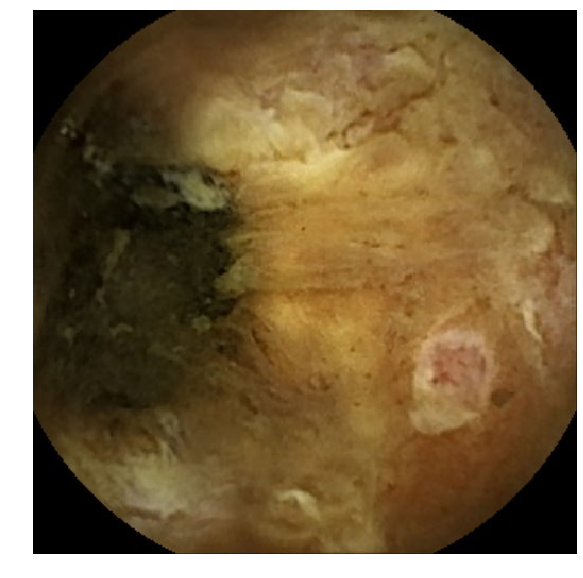

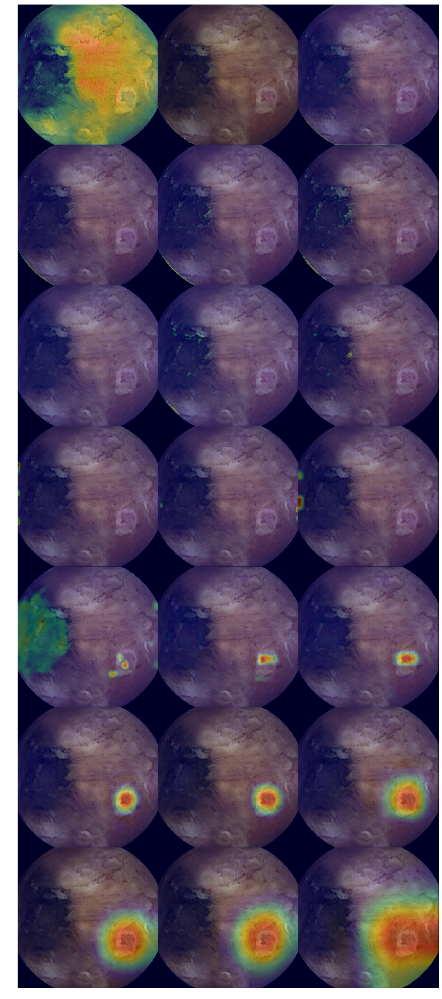

In [17]:
cam_plot = np.zeros([512*7, 512*3, 3]).astype('uint8')
for idx in range(len(cam_by_layer)):
    i = 512*(idx//3)
    j = 512*(idx%3)
    cam_plot[i:i+512, j:j+512, :] = cam_by_layer[idx][0]
    
target_pic = np.transpose(test_X[-1], (1, 2, 0))
fig, ax = plt.subplots(1, 1, figsize = (10, 10))
ax.imshow(cv2.cvtColor(target_pic.astype('uint8'), cv2.COLOR_BGR2RGB))
ax.axis('off')
fig.show()
# fig.savefig('./results/3_gradcam/red_spot_{}_original.png'.format(x_idx), bbox_inches='tight')
fig, ax = plt.subplots(1, 1, figsize = (20, 40))
ax.imshow(cv2.cvtColor(cam_plot, cv2.COLOR_BGR2RGB))
ax.axis('off')
fig.show()
# fig.savefig('./results/3_gradcam/red_spot_{}_gradcam.png'.format(x_idx), bbox_inches='tight')

## 3.2. For multi-images

In [18]:
p_idx = np.where(test_Y == 1)[0]
p_idx

array([1005, 1006, 1007, ..., 2364, 2365, 2366])

In [19]:
def extract_gradcam(img, target_layers = ['conv6_2'], target_class = None):
        
    x = torch.tensor(img, device=device).float()
    img_shape = img.shape[2:]
    (dark_xs, dark_ys) = np.where(np.mean(img[0], axis = 0) < 6)

#         img = np.transpose(img, (0, 2, 3, 1))

    grad_by_layer = []
    def save_gradient(grad):
        grad_by_layer.append(grad)

    feature_by_layer = []

    for name, module in model._modules.items():
    #         print(name)
        x = module(x)
        if 'conv' in name:
            x = nn.ReLU()(x)
        if name in target_layers:
            feature_by_layer.append(x) 
            x.register_hook(save_gradient)
        if 'maxp7' == name:
            x = x.view(x.size(0), -1)

    logits = x
#         logits = F.softmax(x, -1)

    one_hot = np.zeros((img.shape[0], 2), dtype=np.float32)
    one_hot = torch.from_numpy(one_hot).to(device).requires_grad_(True)

    if target_class == None:
        for i, cls in enumerate(logits.argmax(axis =1).tolist()):
            one_hot[i, cls] = 1
    elif target_class is not None:
        one_hot[:, target_class] = 1
#         one_hot = np.sum(logits * one_hot)

    for target_layer in target_layers:
        model._modules[target_layer].zero_grad()

    model.zero_grad()

    logits.backward(gradient=one_hot, retain_graph=True)

    cam_by_layer = []
    for features, gradients in zip(feature_by_layer, reversed(grad_by_layer)): 
        cams = []
        for n, feature, gradient in zip(range(len(img)), features, gradients):

            grad_val = gradient.data.cpu().numpy()
            weights = np.mean(grad_val, axis=(1, 2))

            target = feature.cpu().data.numpy()
            cam = np.zeros(target.shape[1:], dtype=np.float32)

            for i, w in enumerate(weights):
                cam += w * target[i, :, :]

            cam = np.maximum(cam, 0)
            cam_re = cv2.resize(cam, img.shape[2:], interpolation=cv2.INTER_CUBIC)
            cam_re = cam_re - np.min(cam_re)
            cam_re = cam_re / np.max(cam_re)
            cam_re[dark_xs, dark_ys] = 0

    #         cams.append(cam_re)

            heatmap = cv2.applyColorMap((cam_re*255).astype('uint8'), cv2.COLORMAP_JET)
            target_pic = np.transpose(img[n], (1, 2, 0))
            cam_on_img = (heatmap*0.3 + target_pic*0.7).astype('uint8')

            cams.append(cam_on_img)  
        cam_by_layer.append(cams)

    if len(feature_by_layer) == 1:
        return cams
    elif len(feature_by_layer) > 1:
        return cam_by_layer

In [20]:
def batch_idxs(dataset, batch_size = 32, shuffle = False):

    idxs = np.arange(len(dataset))
    total_size = len(idxs)
    if shuffle:
        np.random.shuffle(idxs)
    start = 0
    b_idxs = []
    while True:
        if total_size > start + batch_size: 
            b_idxs.append(list(idxs[start:start+batch_size]))  
            start += batch_size
        elif total_size <= start + batch_size: 
            b_idxs.append(list(idxs[start:]))
            break 
    return b_idxs

def progress_bar(iteration, total, prefix = '', suffix = '', decimals = 1, barLength = 100):
    formatStr = "{0:." + str(decimals) + "f}"
    percent = formatStr.format(100 * (iteration / float(total)))
    filledLength = int(round(barLength * iteration / float(total)))
    bar = '#' * filledLength + '-' * (barLength - filledLength)
    sys.stdout.write('\r{} |{} | {}{} {}'.format(prefix, bar, percent, '%', suffix)),
    if iteration == total:
        sys.stdout.write('\n')
    sys.stdout.flush()
    
def sec_to_m_s_ms(sec):
    """
    sec: time.time() - start_time
    output: ex) 00:47.421
    """
    min_sec = time.strftime("%M:%S", time.gmtime(sec))
    ms = '{:03d}'.format(int((sec - int(sec))*1000))   
    return '.'.join([min_sec, ms])

In [29]:
batch_size = 64

start_time = time.time()
batches = batch_idxs(p_idx, batch_size)
cams = []

for i, batch in enumerate(batches):
    cam_on_img = extract_gradcam(test_X[p_idx[batch]], target_layers = ['conv6_2'], target_class = 1)
    cams.append(cam_on_img)

    progress_bar(i+1, len(batches), barLength = 80,
                  prefix = '{}: {}(*{})'.format(len(p_idx), len(batches), batch_size), 
                  suffix = 'get gradcam')

cams = np.concatenate(cams)

cam_time = time.time() - start_time
cam_time = sec_to_m_s_ms(cam_time)

/home/project/pytorch/lib/python3.5/site-packages/ipykernel_launcher.py:63: RuntimeWarning: invalid value encountered in true_divide


1362: 22(*64) |################################################################################ | 100.0% get gradcam


In [22]:
cams.shape

(1362, 512, 512, 3)

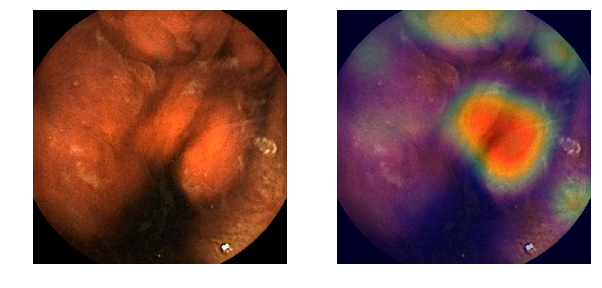

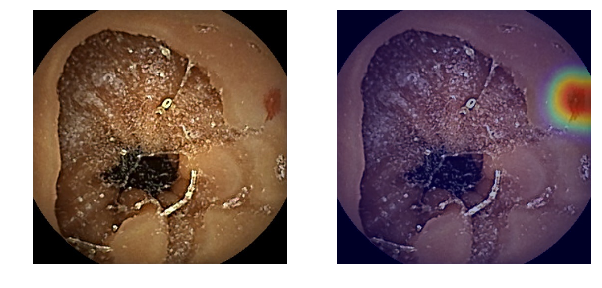

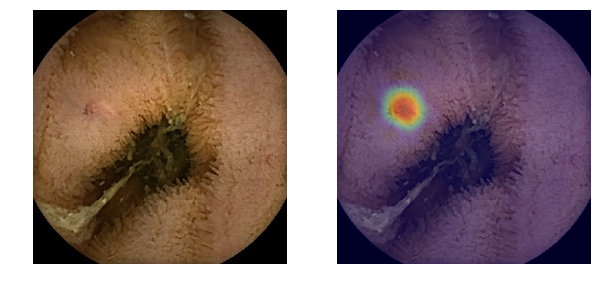

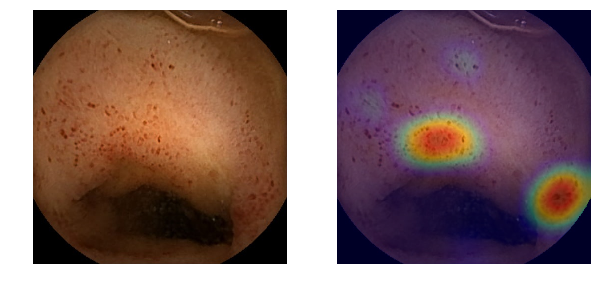

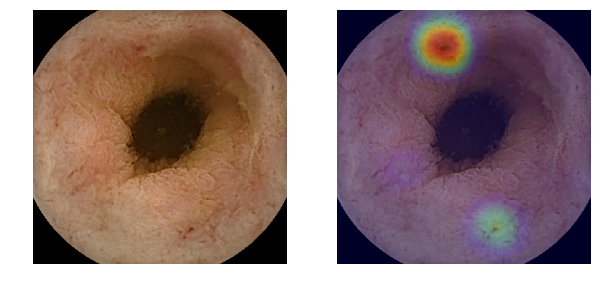

...

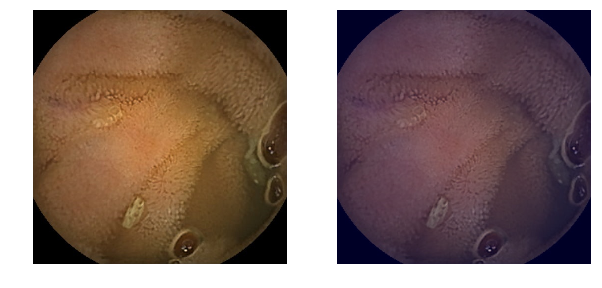

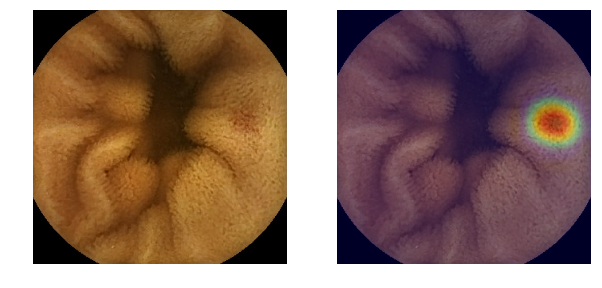

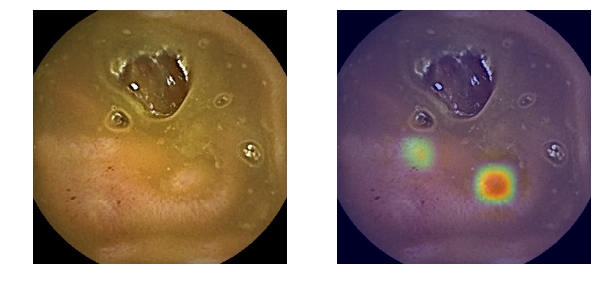

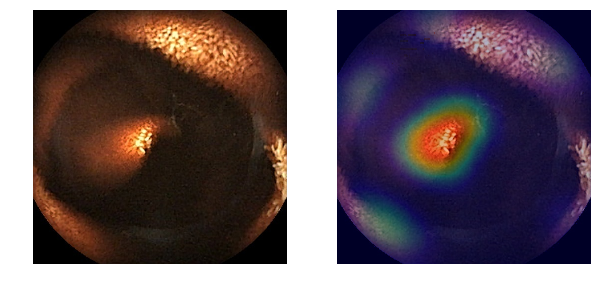

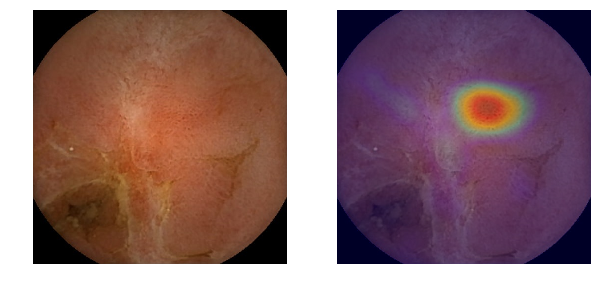

In [30]:
idxs = np.random.choice(len(p_idx), 50)
# idxs = p_idx[:10]

for i in idxs:
    
    fig, axes = plt.subplots(1, 2, figsize = (10, 20))
    axes[0].imshow(cv2.cvtColor(np.transpose(test_X[p_idx[i]], (1, 2, 0)), cv2.COLOR_BGR2RGB))
    axes[0].axis('off')
                   
    axes[1].imshow(cv2.cvtColor(cams[i], cv2.COLOR_BGR2RGB))
    axes[1].axis('off')
    fig.show()
